# Test 1; best case scenario

import packages

In [1]:
%load_ext autoreload
%autoreload 2

import logging
import os
import pathlib
import pickle
import string

import geopandas as gpd
import numpy as np
import pandas as pd
import scipy as sp
import shapely
import verde as vd
import xarray as xr
from invert4geom import inversion, plotting, regional, uncertainty, utils
from polartoolkit import fetch, maps, profiles
from polartoolkit import utils as polar_utils

import synthetic_bathymetry_inversion.plotting as synth_plotting
from synthetic_bathymetry_inversion import synthetic

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

logging.getLogger().setLevel(logging.INFO)

/home/sungw937/miniforge3/envs/synthetic_bathymetry_inversion/lib/python3.12/site-packages/UQpy/__init__.py:6: UserWarning:

pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.



In [2]:
fpath = "../results/Ross_Sea/Ross_Sea_01"

## Get synthetic model data

requested spacing (2000.0) is smaller than the original (5000.0).


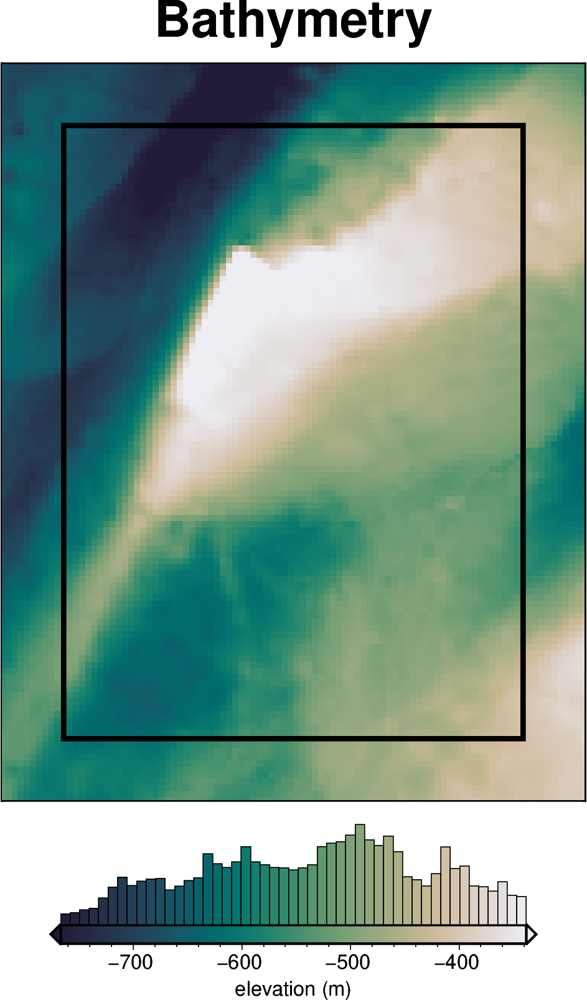

  0%|          | 0/7676 [00:00<?, ?it/s]

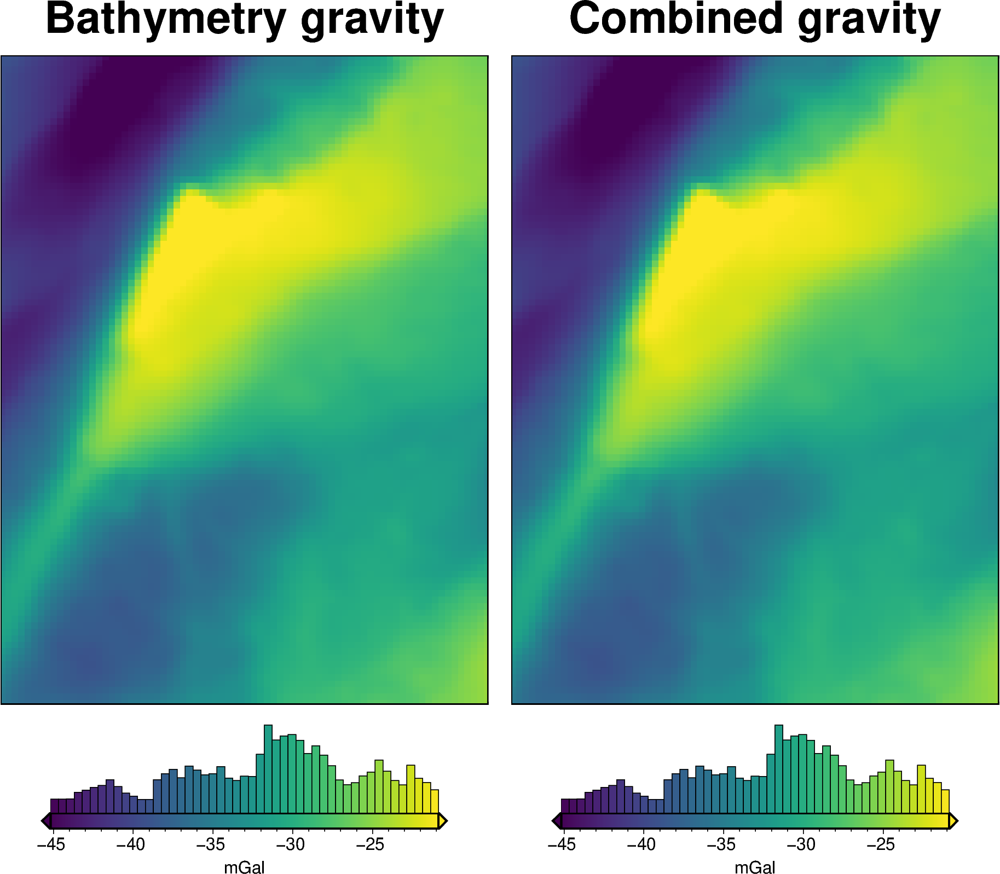

In [3]:
# set grid parameters
spacing = 2e3
inversion_region = (-40e3, 110e3, -1600e3, -1400e3)

true_density_contrast = 1476

bathymetry, basement, grav_df = synthetic.load_synthetic_model(
    spacing=spacing,
    inversion_region=inversion_region,
    buffer=spacing * 10,
    zref=0,
    bathymetry_density_contrast=true_density_contrast,
)
buffer_region = polar_utils.get_grid_info(bathymetry)[1]

In [4]:
grav_df.head()

,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly
0,-1600000.0,-40000.0,1000.0,-35.551085,0,-35.551085,-35.551085
1,-1600000.0,-38000.0,1000.0,-36.054683,0,-36.054683,-36.054683
2,-1600000.0,-36000.0,1000.0,-36.473168,0,-36.473168,-36.473168
3,-1600000.0,-34000.0,1000.0,-36.755627,0,-36.755627,-36.755627
4,-1600000.0,-32000.0,1000.0,-36.951045,0,-36.951045,-36.951045


## Make starting bathymetry model

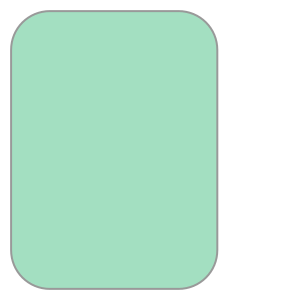

In [5]:
df = polar_utils.region_to_df(inversion_region)
gdf = gpd.GeoDataFrame(
    index=[0],
    geometry=[shapely.geometry.Polygon(zip(df.easting, df.northing, strict=False))],
)
polygon = gdf.geometry.envelope.buffer(-30e3).buffer(27e3)
polygon.to_file("../results/Ross_Sea_outline.shp")
polygon.iloc[0]

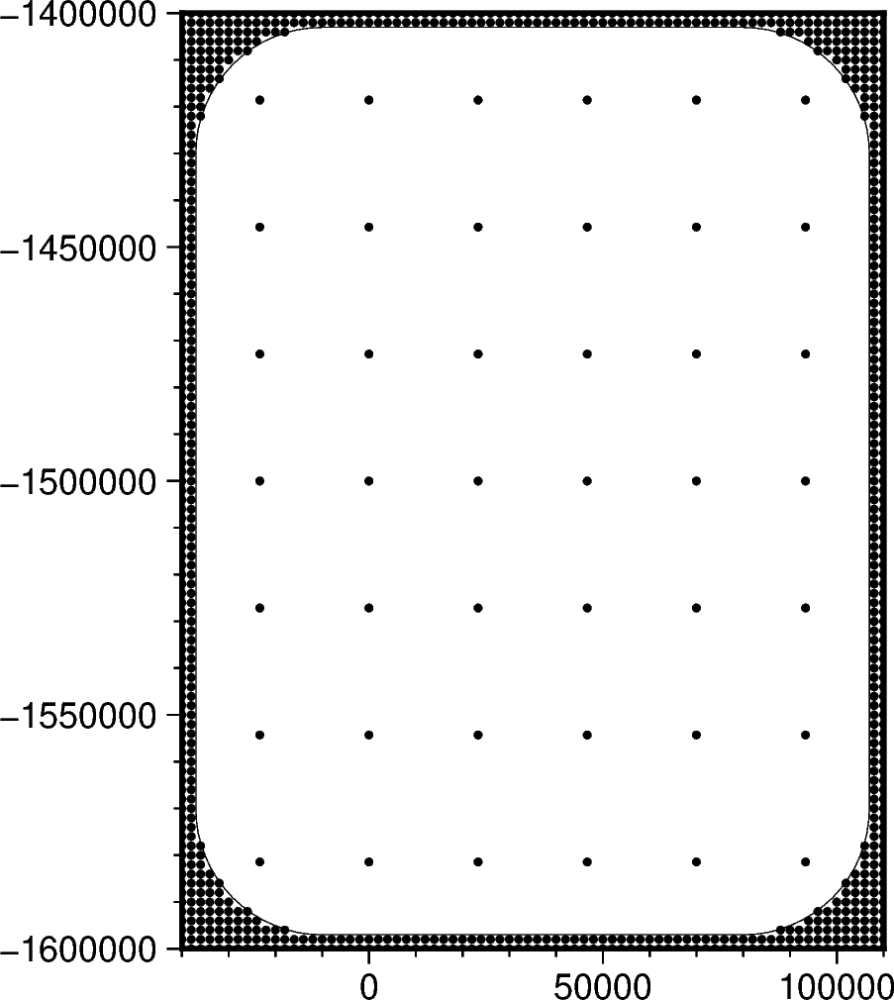

,northing,easting,inside,true_upward,upward
0,-1.600000e+06,-4.000000e+04,False,-601.093994,-601.093994
1,-1.600000e+06,-3.800000e+04,False,-609.216919,-609.216919
2,-1.600000e+06,-3.600000e+04,False,-616.355957,-616.355957
3,-1.600000e+06,-3.400000e+04,False,-621.262268,-621.262268
4,-1.600000e+06,-3.200000e+04,False,-625.510925,-625.510925
...,...,...,...,...,...
881,-1.418571e+06,-3.637979e-12,True,-747.305711,-747.305711
882,-1.418571e+06,2.333333e+04,True,-619.672055,-619.672055
883,-1.418571e+06,4.666667e+04,True,-505.761536,-505.761536
884,-1.418571e+06,7.000000e+04,True,-447.753091,-447.753091


In [6]:
# semi-regularly spaced
constraint_points = synthetic.constraint_layout_number(
    shape=(6, 7),
    region=inversion_region,
    padding=-spacing,
    shapefile="../results/Ross_Sea_outline.shp",
    add_outside_points=True,
    grid_spacing=spacing,
    plot=True,
)

# sample true topography at these points
constraint_points = utils.sample_grids(
    constraint_points,
    bathymetry,
    "true_upward",
    coord_names=("easting", "northing"),
)
constraint_points["upward"] = constraint_points.true_upward
constraint_points

In [7]:
# calculate average constraint spacing
df = constraint_points[constraint_points.inside]
constraint_spacing = (
    np.median(
        vd.median_distance(
            (df.easting, df.northing),
            k_nearest=1,
        )
    )
    / 1e3
)
print(f"Constraint spacing: {constraint_spacing} km")

Constraint spacing: 23.333333333333332 km


In [8]:
# calculate gravity data median distance
grd = bathymetry.sel(
    easting=slice(*inversion_region[:2]), northing=slice(*inversion_region[2:])
)
grd = fetch.resample_grid(grd, spacing=100, verbose="q").rename(
    {"x": "easting", "y": "northing"}
)

min_dist = utils.dist_nearest_points(
    constraint_points,
    grd,
).min_dist

mean_proximity = min_dist.mean().to_numpy()
median_proximity = min_dist.median().to_numpy()
max_proximity = min_dist.max().to_numpy()
print(f"mean constraint proximity: {int(mean_proximity)} m")
print(f"median constraint proximity: {int(median_proximity)} m")
print(f"maximum constraint proximity: {int(max_proximity)} m")

print(f"max/mean ratio: {round((max_proximity / mean_proximity), 3)}")
print(f"max_median/ ratio: {round((max_proximity / median_proximity), 3)}")

print(
    f"Skewness: {round(sp.stats.skew(min_dist.to_numpy().ravel(), nan_policy='omit'), 4)}"
)

requested spacing (100) is smaller than the original (2000.0).


mean constraint proximity: 7813 m
median constraint proximity: 7978 m
maximum constraint proximity: 17885 m
max/mean ratio: 2.289
max_median/ ratio: 2.242
Skewness: -0.0402


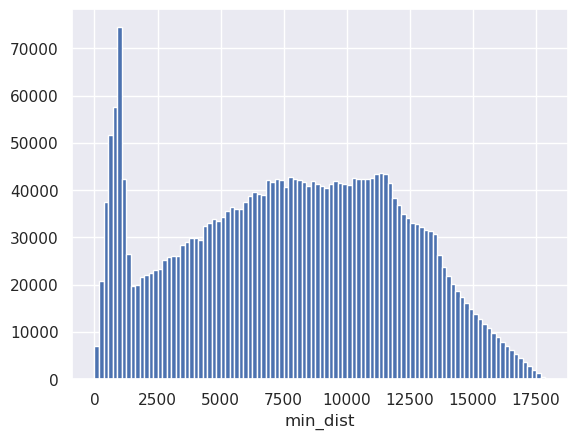

In [9]:
_ = min_dist.plot.hist(bins=100)

In [10]:
# mask to the ice shelf outline
min_dist = polar_utils.mask_from_shp(
    shapefile="../results/Ross_Sea_outline.shp",
    grid=min_dist,
    invert=False,
    masked=True,
)

mean_proximity = min_dist.mean().to_numpy()
median_proximity = min_dist.median().to_numpy()
max_proximity = min_dist.max().to_numpy()
print(f"mean constraint proximity: {int(mean_proximity)} m")
print(f"median constraint proximity: {int(median_proximity)} m")
print(f"maximum constraint proximity: {int(max_proximity)} m")

print(f"max/mean ratio: {round((max_proximity / mean_proximity), 3)}")
print(f"max_median/ ratio: {round((max_proximity / median_proximity), 3)}")

print(
    f"Skewness: {round(sp.stats.skew(min_dist.to_numpy().ravel(), nan_policy='omit'), 4)}"
)

mean constraint proximity: 8516 m
median constraint proximity: 8557 m
maximum constraint proximity: 17885 m
max/mean ratio: 2.1
max_median/ ratio: 2.09
Skewness: 0.0043


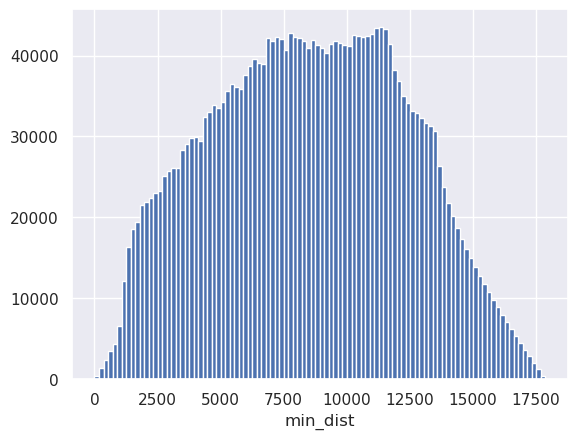

In [11]:
_ = min_dist.plot.hist(bins=100)

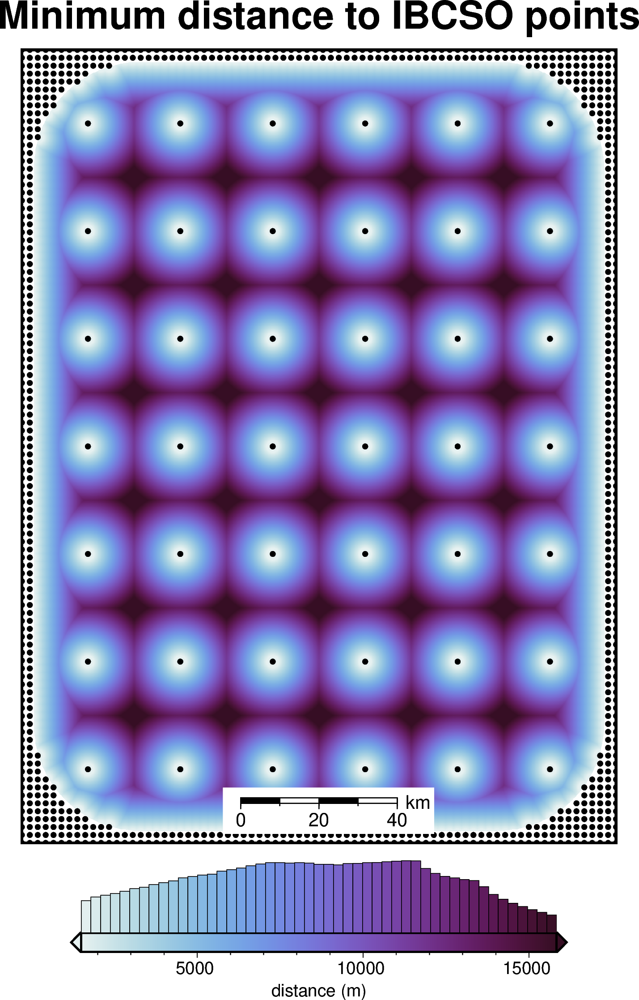

In [12]:
fig = maps.plot_grd(
    min_dist,
    region=inversion_region,
    title="Minimum distance to IBCSO points",
    cbar_label="distance (m)",
    cmap="dense",
    hist=True,
    robust=True,
    points=constraint_points,
    points_style="c2p",
    points_fill="black",
    scalebar=True,
)
fig.show()

In [13]:
# grid the sampled values using verde
starting_topography_kwargs = dict(
    method="splines",
    region=buffer_region,
    spacing=spacing,
    constraints_df=constraint_points,
    dampings=None,
)
starting_bathymetry = utils.create_topography(**starting_topography_kwargs)

starting_bathymetry

<xarray.DataArray 'scalars' (northing: 121, easting: 96)> Size: 93kB
array([[-541.24413869, -544.57181187, -547.92293689, ..., -360.00006254,
        -357.06767408, -354.19957766],
       [-543.34402688, -546.81675803, -550.35256333, ..., -362.90253226,
        -359.96874158, -357.11431886],
       [-545.05533622, -548.66036838, -552.37518163, ..., -365.66137905,
        -362.73269531, -359.90052824],
       ...,
       [-591.95335283, -595.518822  , -599.06869705, ..., -440.89315875,
        -440.6944619 , -440.40553782],
       [-590.53134833, -594.09076637, -597.64079288, ..., -440.69158328,
        -440.42525249, -440.07197234],
       [-589.16632671, -592.73504777, -596.30209679, ..., -440.51760947,
        -440.1713932 , -439.74434037]], shape=(121, 96))
Coordinates:
  * northing  (northing) float64 968B -1.62e+06 -1.618e+06 ... -1.38e+06
  * easting   (easting) float64 768B -6e+04 -5.8e+04 ... 1.28e+05 1.3e+05
Attributes:
    metadata:  Generated by SplineCV(cv=KFold(n_splits=5, random_state=0, shu...
    damping:   None

In [14]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    starting_bathymetry,
    "starting_bathymetry",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.starting_bathymetry)
print(f"RMSE: {rmse:.2f} m")

RMSE: 0.03 m


In [15]:
constraint_points

,northing,easting,inside,true_upward,upward,starting_bathymetry
0,-1.600000e+06,-4.000000e+04,False,-601.093994,-601.093994,-601.093994
1,-1.600000e+06,-3.800000e+04,False,-609.216919,-609.216919,-609.216919
2,-1.600000e+06,-3.600000e+04,False,-616.355957,-616.355957,-616.355957
3,-1.600000e+06,-3.400000e+04,False,-621.262268,-621.262268,-621.262268
4,-1.600000e+06,-3.200000e+04,False,-625.510925,-625.510925,-625.510925
...,...,...,...,...,...,...
881,-1.418571e+06,-3.637979e-12,True,-747.305711,-747.305711,-747.289192
882,-1.418571e+06,2.333333e+04,True,-619.672055,-619.672055,-619.459742
883,-1.418571e+06,4.666667e+04,True,-505.761536,-505.761536,-505.739808
884,-1.418571e+06,7.000000e+04,True,-447.753091,-447.753091,-447.782831


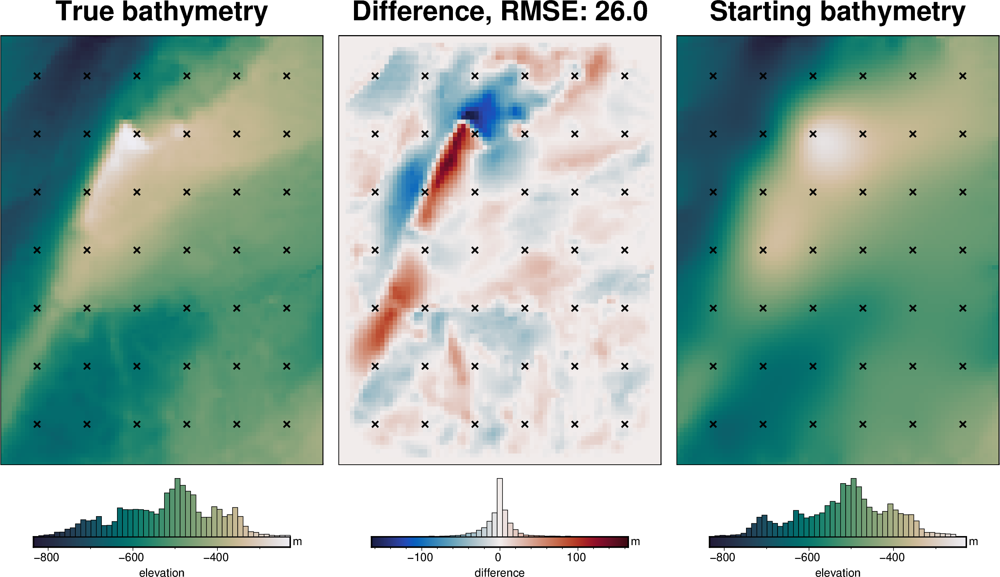

In [16]:
# compare starting and actual bathymetry grids
grids = polar_utils.grd_compare(
    bathymetry,
    starting_bathymetry,
    fig_height=10,
    plot=True,
    cmap="rain",
    reverse_cpt=True,
    diff_cmap="balance+h0",
    grid1_name="True bathymetry",
    grid2_name="Starting bathymetry",
    title="Difference",
    title_font="18p,Helvetica-Bold,black",
    cbar_unit="m",
    cbar_label="elevation",
    RMSE_decimals=0,
    region=inversion_region,
    inset=False,
    hist=True,
    label_font="16p,Helvetica,black",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [17]:
# the true density contrast is 1476 kg/m3
density_contrast = 1350


density_grid = xr.where(
    starting_bathymetry >= 0,
    density_contrast,
    -density_contrast,
)

# create layer of prisms
starting_prisms = utils.grids_to_prisms(
    starting_bathymetry,
    0,
    density=density_grid,
)

grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)

grav_df

  0%|          | 0/7676 [00:00<?, ?it/s]

,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly,starting_gravity
0,-1600000.0,-40000.0,1000.0,-35.551085,0,-35.551085,-35.551085,-32.541367
1,-1600000.0,-38000.0,1000.0,-36.054683,0,-36.054683,-36.054683,-32.965831
2,-1600000.0,-36000.0,1000.0,-36.473168,0,-36.473168,-36.473168,-33.347648
3,-1600000.0,-34000.0,1000.0,-36.755627,0,-36.755627,-36.755627,-33.644496
4,-1600000.0,-32000.0,1000.0,-36.951045,0,-36.951045,-36.951045,-33.840063
...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760090,0,-25.760090,-25.760090,-23.321506
7672,-1400000.0,104000.0,1000.0,-25.911429,0,-25.911429,-25.911429,-23.482116
7673,-1400000.0,106000.0,1000.0,-26.032814,0,-26.032814,-26.032814,-23.605602
7674,-1400000.0,108000.0,1000.0,-26.121903,0,-26.121903,-26.121903,-23.693171


In [18]:
regional_grav_kwargs = dict(
    method="constant",
    constraints_df=constraint_points,
)
grav_df = regional.regional_separation(
    grav_df=grav_df,
    **regional_grav_kwargs,
)

grav_df

,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly,starting_gravity,misfit,reg,res
0,-1600000.0,-40000.0,1000.0,-35.551085,0,-35.551085,-35.551085,-32.541367,-3.009718,-2.91949,-0.090228
1,-1600000.0,-38000.0,1000.0,-36.054683,0,-36.054683,-36.054683,-32.965831,-3.088852,-2.91949,-0.169362
2,-1600000.0,-36000.0,1000.0,-36.473168,0,-36.473168,-36.473168,-33.347648,-3.125521,-2.91949,-0.206030
3,-1600000.0,-34000.0,1000.0,-36.755627,0,-36.755627,-36.755627,-33.644496,-3.111132,-2.91949,-0.191641
4,-1600000.0,-32000.0,1000.0,-36.951045,0,-36.951045,-36.951045,-33.840063,-3.110982,-2.91949,-0.191492
...,...,...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760090,0,-25.760090,-25.760090,-23.321506,-2.438584,-2.91949,0.480906
7672,-1400000.0,104000.0,1000.0,-25.911429,0,-25.911429,-25.911429,-23.482116,-2.429314,-2.91949,0.490176
7673,-1400000.0,106000.0,1000.0,-26.032814,0,-26.032814,-26.032814,-23.605602,-2.427211,-2.91949,0.492279
7674,-1400000.0,108000.0,1000.0,-26.121903,0,-26.121903,-26.121903,-23.693171,-2.428732,-2.91949,0.490758


makecpt [ERROR]: Option T: min >= max
supplied min value is greater or equal to max value
Grid/points are a constant value, can't make a colorbar histogram!


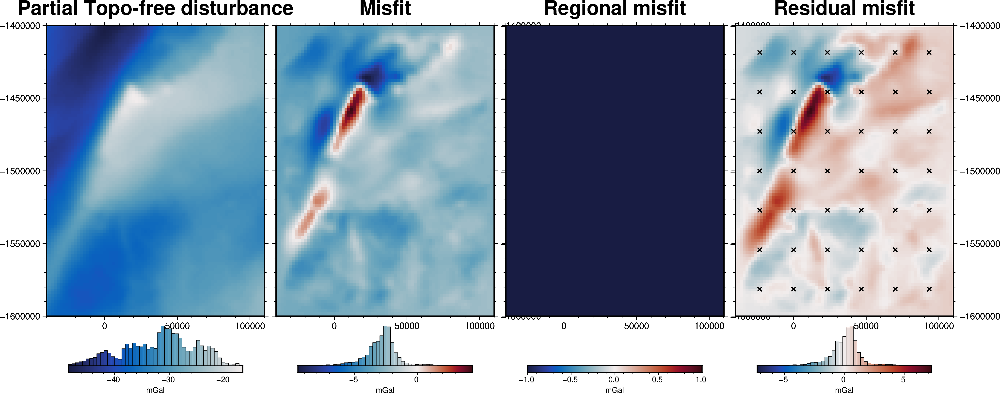

In [19]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Partial Topo-free disturbance",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.misfit,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.reg,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Regional misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.res,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Residual misfit",
    cmap="balance+h0",
    cpt_lims=[-vd.maxabs(grav_grid.res), vd.maxabs(grav_grid.res)],
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)
fig.show()

In [20]:
# set kwargs to pass to the inversion
kwargs = {
    # set stopping criteria
    "max_iterations": 200,
    "l2_norm_tolerance": 0.2**0.5,  # square root of the gravity noise
    "delta_l2_norm_tolerance": 1.008,
}

## Damping Cross Validation

In [25]:
logging.getLogger().setLevel(logging.INFO)

# run the inversion workflow, including a cross validation for the damping parameter
results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    starting_prisms=starting_prisms,
    # for creating test/train splits
    grav_spacing=spacing,
    inversion_region=inversion_region,
    run_damping_cv=True,
    damping_limits=(0.001, 0.1),
    damping_cv_trials=8,
    fname=f"{fpath}_damping_cv",
    **kwargs,
)

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

In [21]:
# load saved inversion results
with pathlib.Path(f"{fpath}_damping_cv_results.pickle").open("rb") as f:
    results = pickle.load(f)

# load study
with pathlib.Path(f"{fpath}_damping_cv_damping_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

In [22]:
best_damping = parameters.get("Solver damping")
kwargs["solver_damping"] = best_damping
best_damping

0.014002832326761543

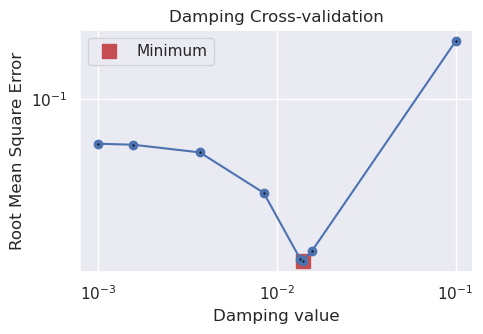

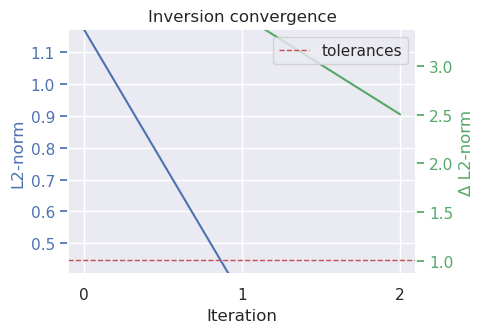

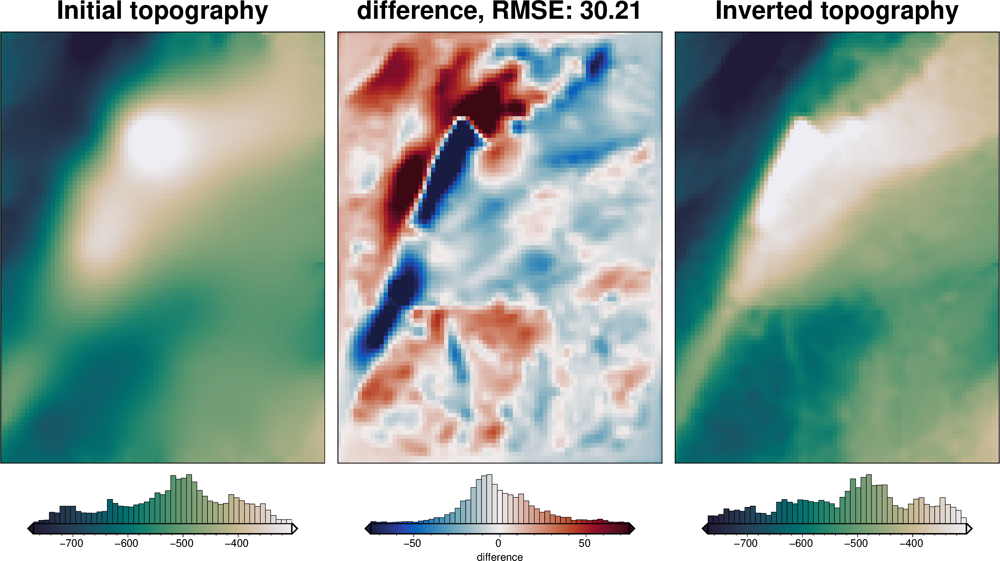

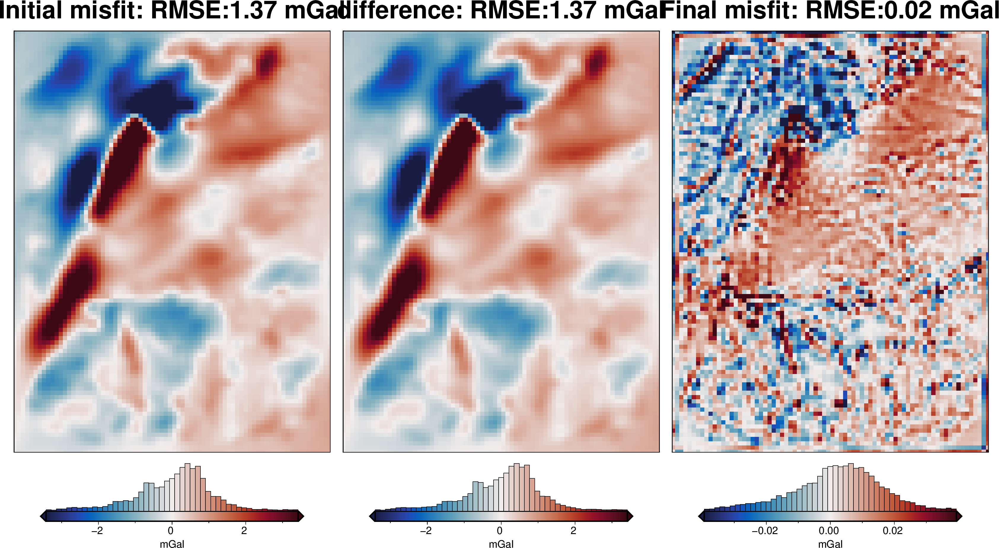

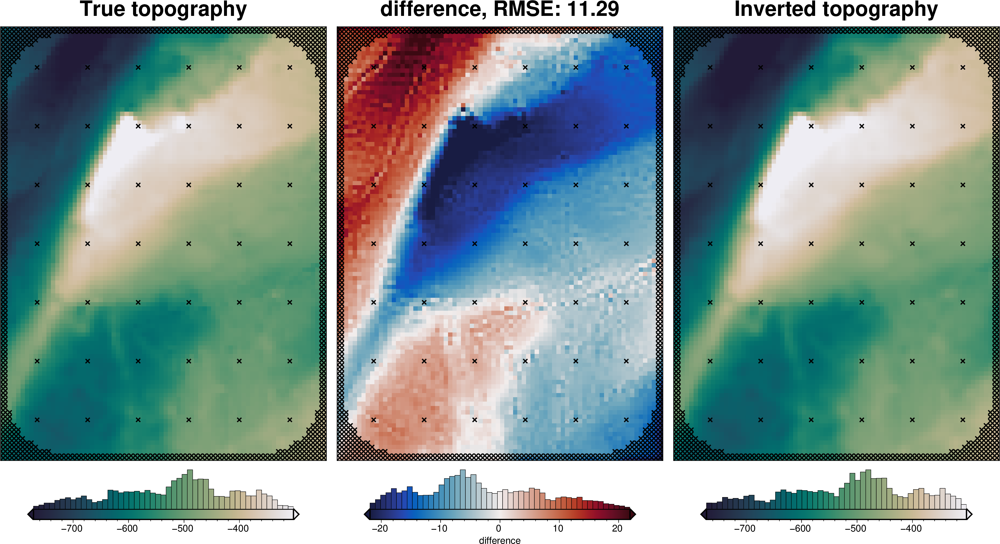

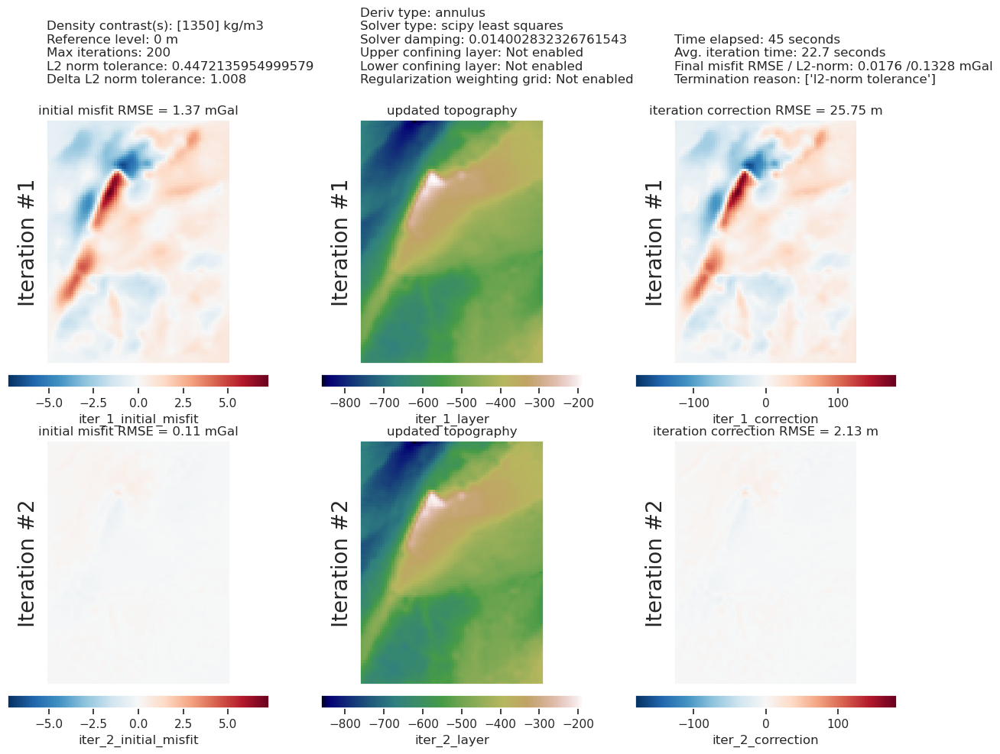

In [23]:
study_df = study.trials_dataframe()

plotting.plot_cv_scores(
    study_df.value,
    study_df.params_damping,
    param_name="Damping",
    logx=True,
    logy=True,
)

plotting.plot_convergence(
    grav_results,
    params=parameters,
)

plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

_ = polar_utils.grd_compare(
    bathymetry,
    final_topography,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.2c",
)

In [24]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    final_topography,
    "inverted_topography",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.inverted_topography)
print(f"RMSE: {rmse:.2f} m")

RMSE: 12.25 m


## Density CV

In [31]:
logging.getLogger().setLevel(logging.INFO)

# run the inversion workflow, including a cross validation for the damping parameter
results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    starting_topography=starting_bathymetry,
    zref=0,
    calculate_regional_misfit=True,
    regional_grav_kwargs=dict(
        grav_df=grav_df,
        method="constant",
        constant=0,
    ),
    run_zref_or_density_cv=True,
    constraints_df=constraint_points,
    density_contrast_limits=(1000, 2400),
    zref_density_cv_trials=10,
    fname=f"{fpath}_density_cv",
    **kwargs,
)

'reg' already a column of `grav_df`, but is being overwritten since calculate_regional_misfit is True


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

'starting_gravity' already a column of `grav_df`, but is being overwritten since calculate_starting_gravity is True
'reg' already a column of `grav_df`, but is being overwritten since calculate_regional_misfit is True


In [25]:
# load saved inversion results
with pathlib.Path(f"{fpath}_density_cv_results.pickle").open("rb") as f:
    results = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results


# load study
with pathlib.Path(f"{fpath}_density_cv_zref_density_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

In [26]:
best_density_contrast = study.best_params["density_contrast"]
print("optimal determined density contrast", best_density_contrast)
print("real density contrast", true_density_contrast)

optimal determined density contrast 1480
real density contrast 1476


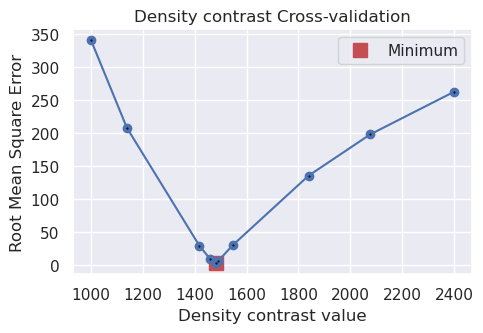

In [27]:
study_df = study.trials_dataframe()

fig = plotting.plot_cv_scores(
    study_df.value,
    study_df.params_density_contrast,
    param_name="Density contrast",
)

### Redo with optimal density contrast
During the density cross-validation to avoid biasing the scores, we had to manually set a regional field. Now, with the optimal density contrast value found, we can rerun the inversion with an automatically determined regional field strength (the average value misfit at the constraints).

In [28]:
density_contrast = best_density_contrast

density_grid = xr.where(
    starting_bathymetry >= 0,
    density_contrast,
    -density_contrast,
)
# create layer of prisms
starting_prisms = utils.grids_to_prisms(
    starting_bathymetry,
    0,
    density=density_grid,
)
grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)

grav_df = regional.regional_separation(
    grav_df=grav_df,
    **regional_grav_kwargs,
)

  0%|          | 0/7676 [00:00<?, ?it/s]

makecpt [ERROR]: Option T: min >= max
supplied min value is greater or equal to max value
Grid/points are a constant value, can't make a colorbar histogram!


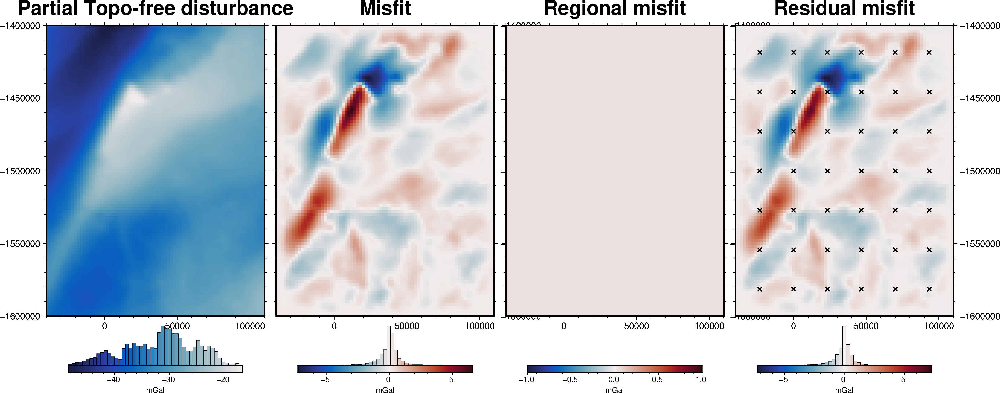

In [29]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Partial Topo-free disturbance",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.misfit,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.reg,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Regional misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.res,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Residual misfit",
    cmap="balance+h0",
    cpt_lims=[-vd.maxabs(grav_grid.res), vd.maxabs(grav_grid.res)],
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)
fig.show()

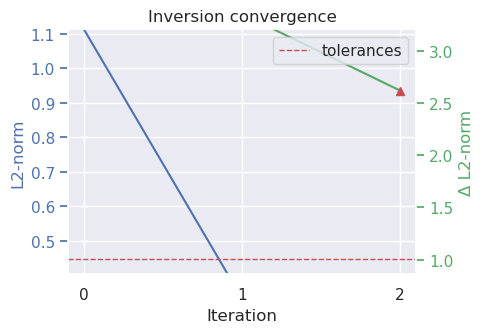

In [30]:
# run the inversion workflow
inversion_results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    fname=f"{fpath}_optimal",
    starting_prisms=starting_prisms,
    plot_dynamic_convergence=True,
    **kwargs,
)

In [31]:
# load saved inversion results
with pathlib.Path(f"{fpath}_optimal_results.pickle").open("rb") as f:
    results = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

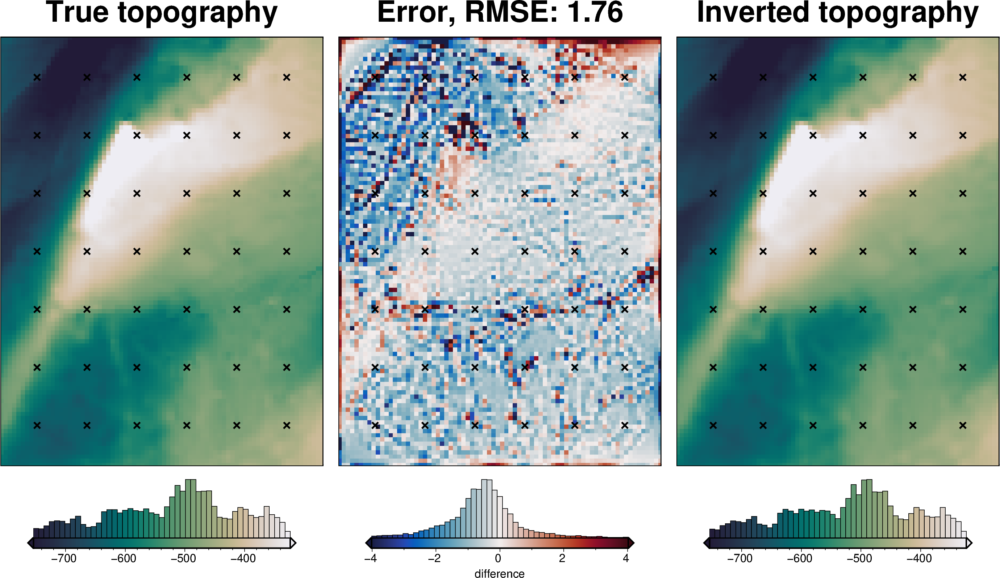

In [32]:
_ = polar_utils.grd_compare(
    bathymetry,
    final_topography,
    fig_height=10,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="Error",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

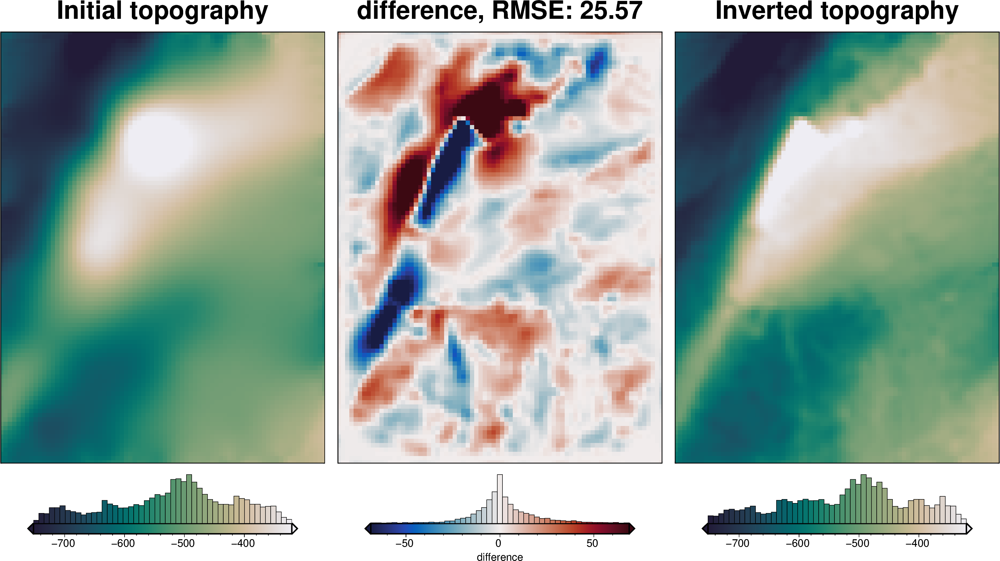

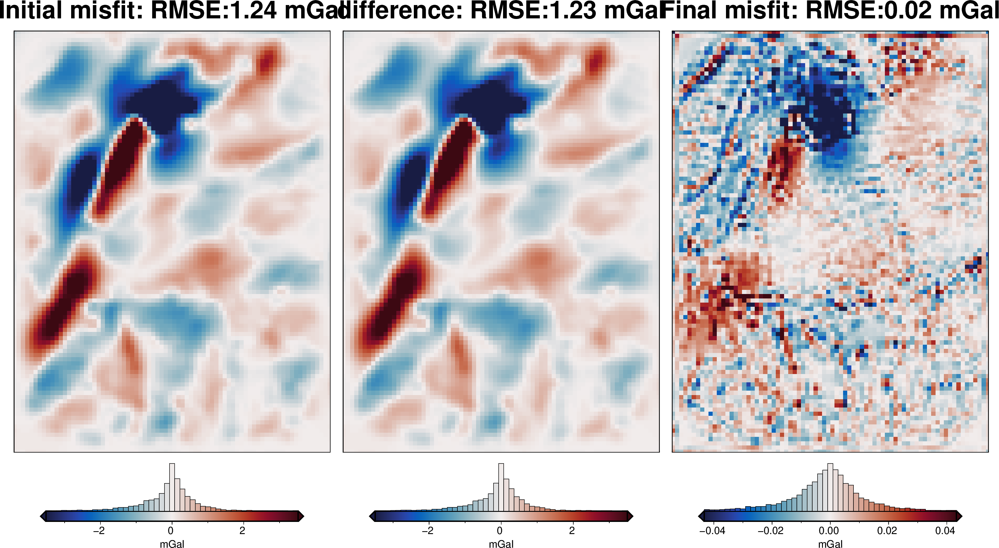

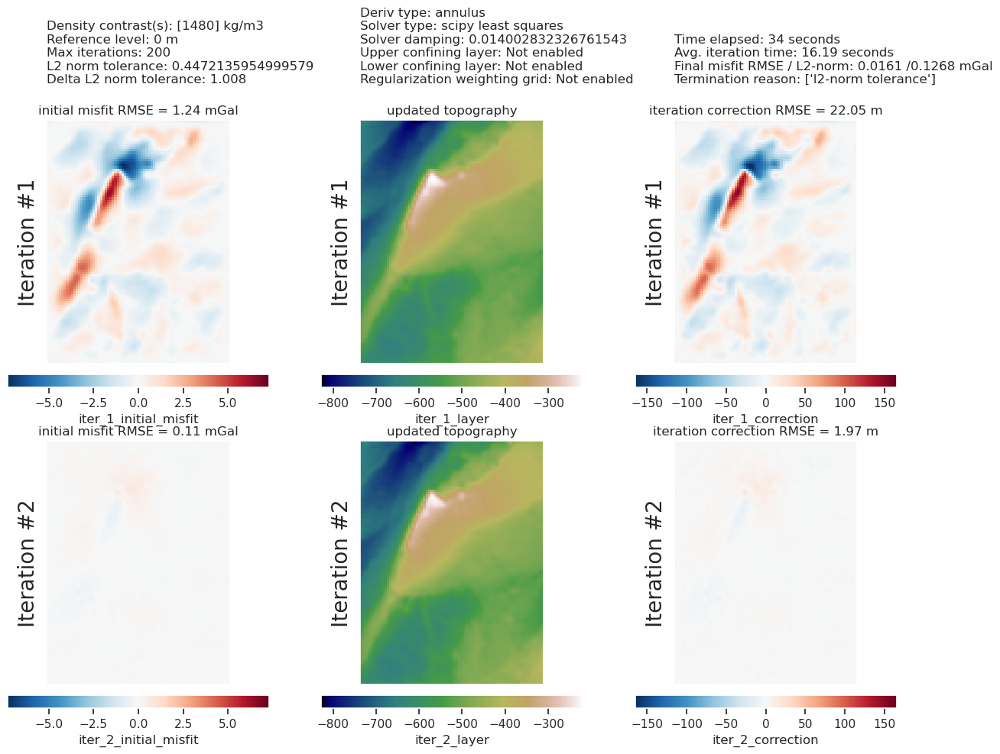

In [33]:
plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

In [34]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    final_topography,
    "inverted_topography",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.inverted_topography)
print(f"RMSE: {rmse:.2f} m")

RMSE: 3.38 m


In [35]:
# save to csv
constraint_points.to_csv(f"{fpath}_constraint_points.csv", index=False)

In [36]:
constraint_points = pd.read_csv(f"{fpath}_constraint_points.csv")
constraint_points

,northing,easting,inside,true_upward,upward,starting_bathymetry,inverted_topography
0,-1.600000e+06,-4.000000e+04,False,-601.093994,-601.093994,-601.093994,-598.464539
1,-1.600000e+06,-3.800000e+04,False,-609.216919,-609.216919,-609.216919,-608.706177
2,-1.600000e+06,-3.600000e+04,False,-616.355957,-616.355957,-616.355957,-615.961426
3,-1.600000e+06,-3.400000e+04,False,-621.262268,-621.262268,-621.262268,-618.796082
4,-1.600000e+06,-3.200000e+04,False,-625.510925,-625.510925,-625.510925,-622.212036
...,...,...,...,...,...,...,...
881,-1.418571e+06,-3.637979e-12,True,-747.305711,-747.305711,-747.289192,-750.725013
882,-1.418571e+06,2.333333e+04,True,-619.672055,-619.672055,-619.459742,-619.793519
883,-1.418571e+06,4.666667e+04,True,-505.761536,-505.761536,-505.739808,-506.767133
884,-1.418571e+06,7.000000e+04,True,-447.753091,-447.753091,-447.782831,-450.044511


## Uncertainty analysis

### Inversion error

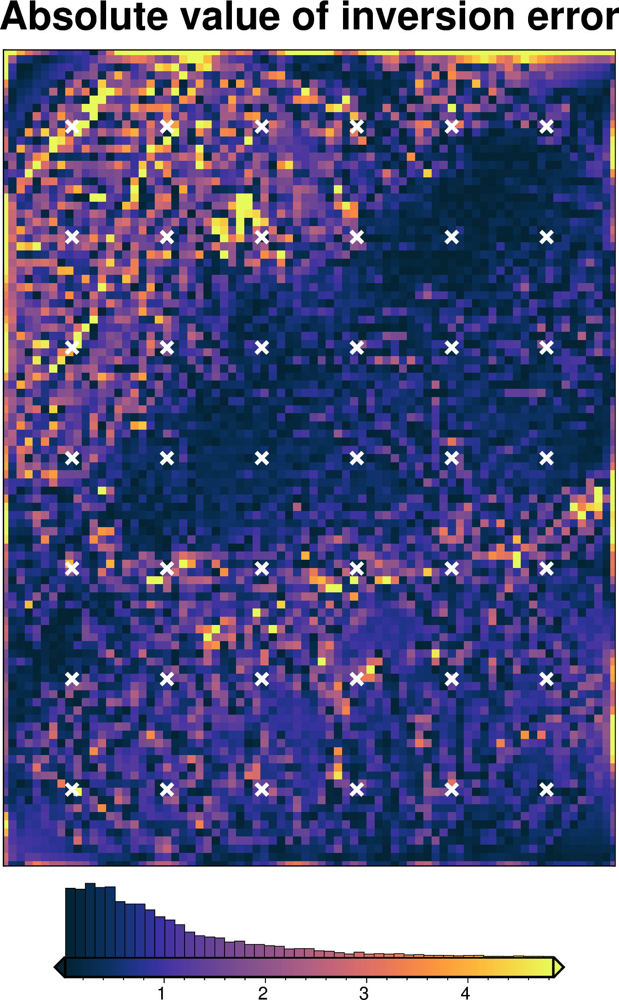

In [37]:
inversion_error = np.abs(bathymetry - final_topography)

fig = maps.plot_grd(
    inversion_error,
    region=inversion_region,
    hist=True,
    cmap="thermal",
    title="Absolute value of inversion error",
    robust=True,
    points=constraint_points[constraint_points.inside],
    points_style="x.3c",
    points_fill="white",
    points_pen="2p",
)
fig.show()

In [38]:
# kwargs to reuse for all uncertainty analyses
uncert_kwargs = dict(
    grav_df=grav_df,
    density_contrast=best_density_contrast,
    zref=0,
    starting_prisms=starting_prisms,
    starting_topography=starting_bathymetry,
    regional_grav_kwargs=regional_grav_kwargs,
    **kwargs,
)

### Solver damping component

In [39]:
# load study
with pathlib.Path(f"{fpath}_damping_cv_damping_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

study_df = study.trials_dataframe().drop(columns=["user_attrs_results"])
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

# pick damping standard deviation based on optimization
stdev = np.log10(study_df2.params_damping).std()
print(f"calculated stdev: {stdev}")
stdev = stdev / 2
print(f"using stdev: {stdev}")

calculated stdev: 0.488739771713845
using stdev: 0.2443698858569225


best: 0.014002832326761543 
std: 0.2443698858569225 
+1std: 0.024580220493933578 
-1std: 0.007977117748792801


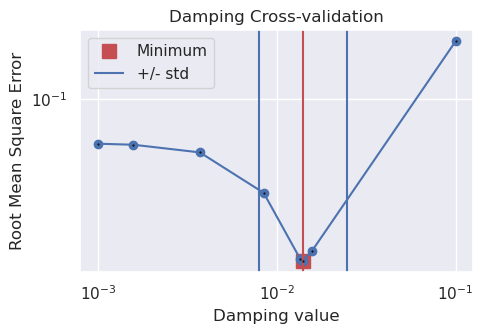

In [40]:
fig = plotting.plot_cv_scores(
    study_df.value,
    study_df.params_damping,
    param_name="Damping",
    logx=True,
    logy=True,
)
ax = fig.axes[0]

best = float(study_df2.params_damping.iloc[0])
upper = float(10 ** (np.log10(best) + stdev))
lower = float(10 ** (np.log10(best) - stdev))

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

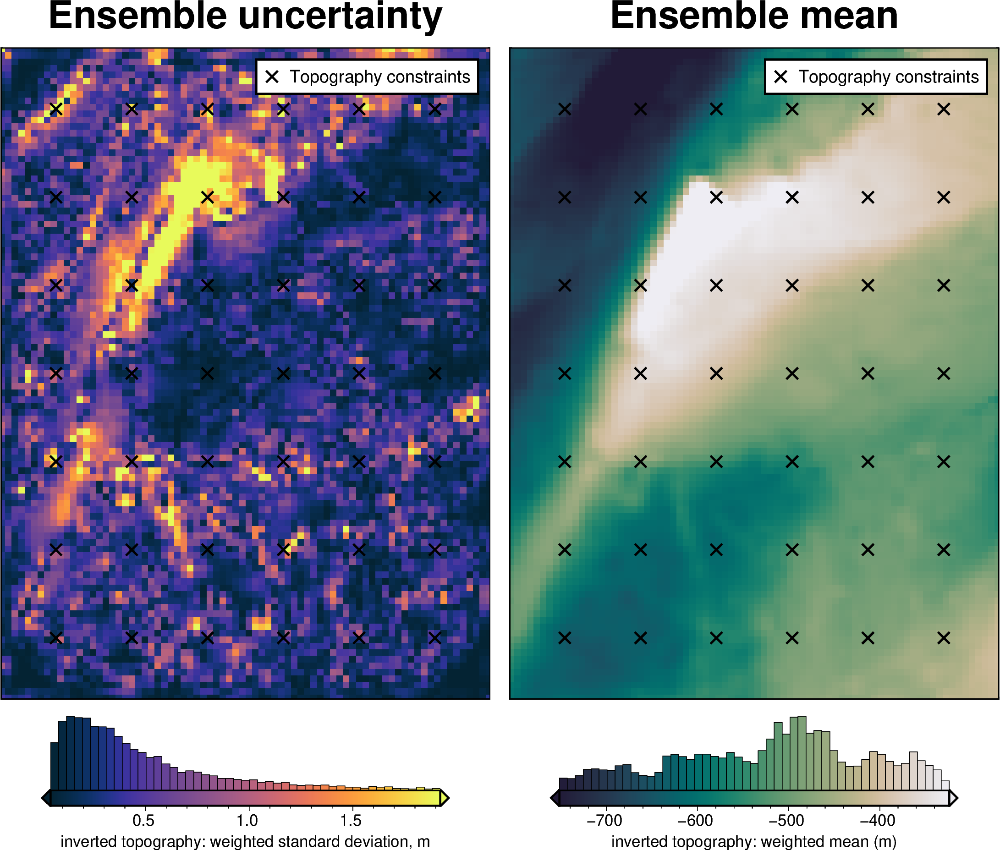

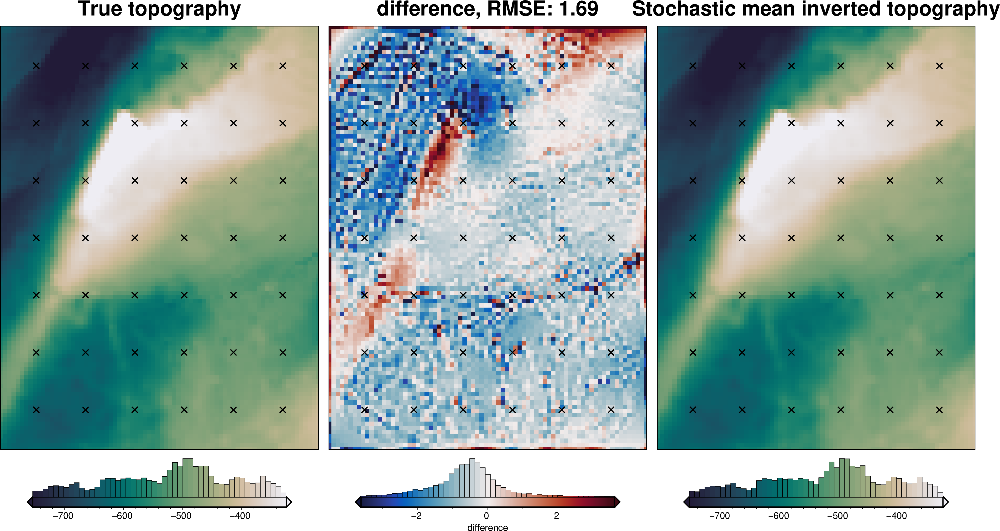

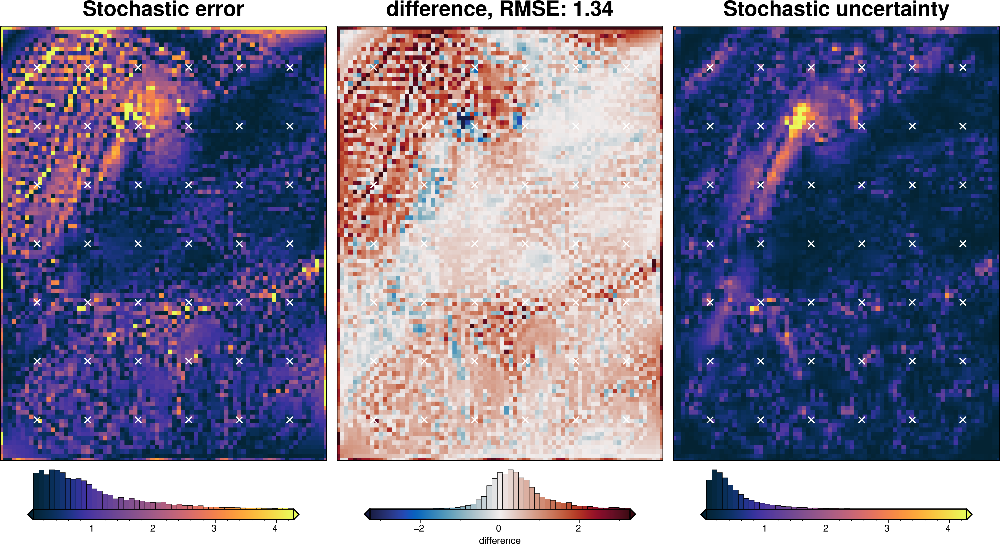

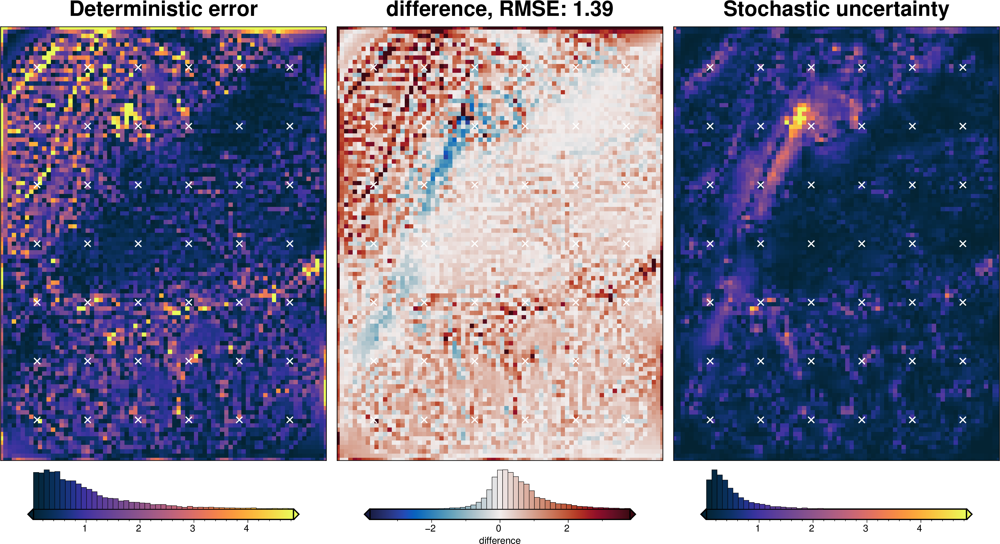

In [41]:
solver_dict = {
    "solver_damping": {
        "distribution": "normal",
        "loc": np.log10(best_damping),  # mean of base 10 exponent
        "scale": stdev,  # standard deviation of base 10 exponent
        "log": True,
    },
}
fname = f"{fpath}_uncertainty_damping_test"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_damping_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    parameter_dict=solver_dict,
    **uncert_kwargs,
)

stats_ds = synth_plotting.uncert_plots(
    uncert_damping_results,
    inversion_region,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
)

### Density component

In [42]:
# load study
with pathlib.Path(f"{fpath}_density_cv_zref_density_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

study_df = study.trials_dataframe()
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

stdev = study_df2.params_density_contrast.std()
print(f"calculated stdev: {stdev}")

# manually pick a stdev
stdev = 5
print(f"using stdev: {stdev}")

print(
    f"density estimation error: {np.abs(true_density_contrast - best_density_contrast)}"
)

calculated stdev: 418.74337142349026
using stdev: 5
density estimation error: 4


best: 1480 
std: 5 
+1std: 1485 
-1std: 1475


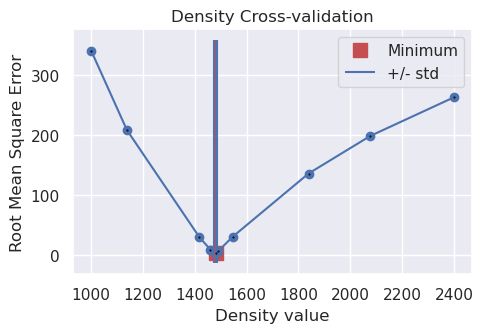

In [43]:
fig = plotting.plot_cv_scores(
    study.trials_dataframe().value.to_numpy(),
    study.trials_dataframe().params_density_contrast.values,
    param_name="Density",
    logx=False,
    logy=False,
)
ax = fig.axes[0]

best = study_df2.params_density_contrast.iloc[0]
upper = best + stdev
lower = best - stdev

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

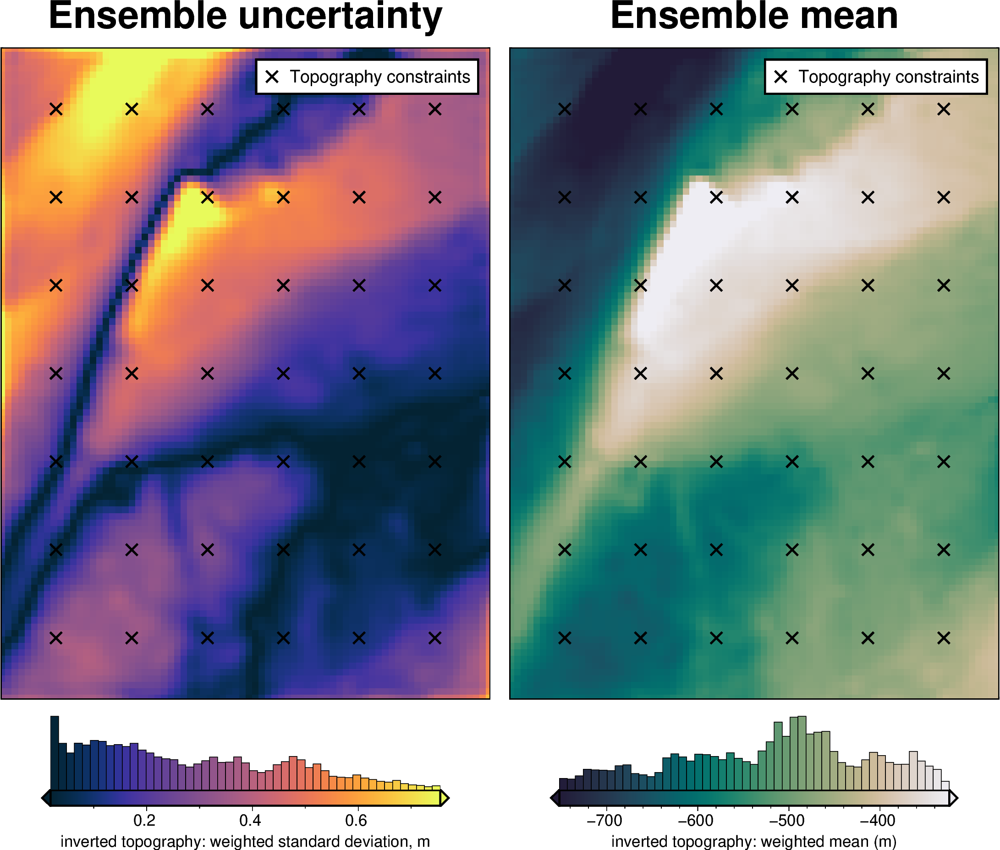

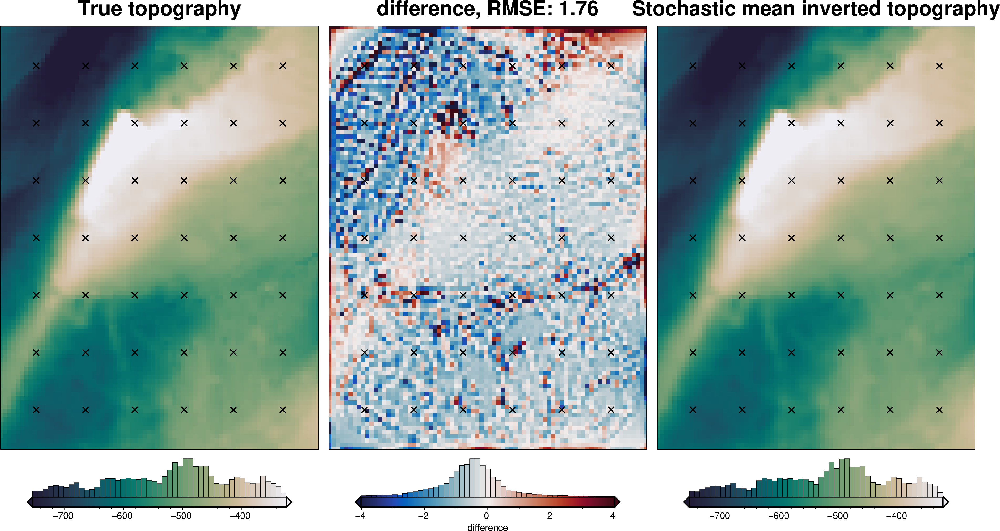

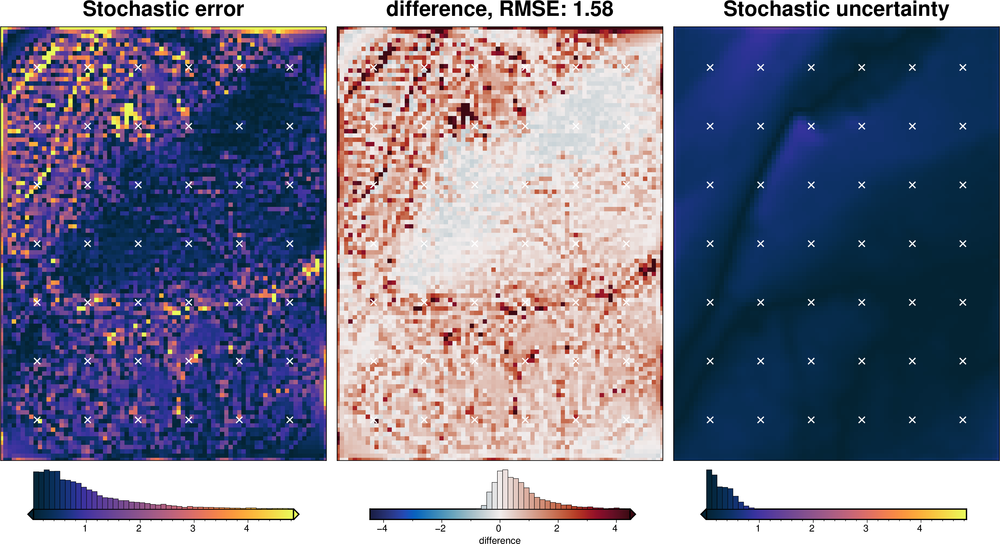

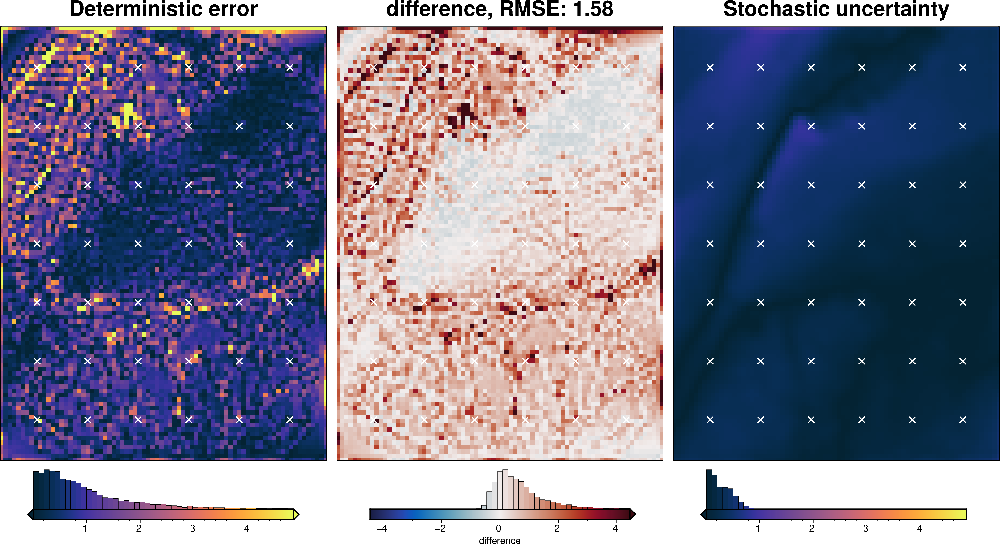

In [44]:
density_dict = {
    "density_contrast": {
        "distribution": "normal",
        "loc": best_density_contrast,
        "scale": stdev,
    },
}
fname = f"{fpath}_uncertainty_density"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_density_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    parameter_dict=density_dict,
    **uncert_kwargs,
)

stats_ds = synth_plotting.uncert_plots(
    uncert_density_results,
    inversion_region,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
)

### Total uncertainty

stochastic ensemble:   0%|          | 0/20 [00:00<?, ?it/s]

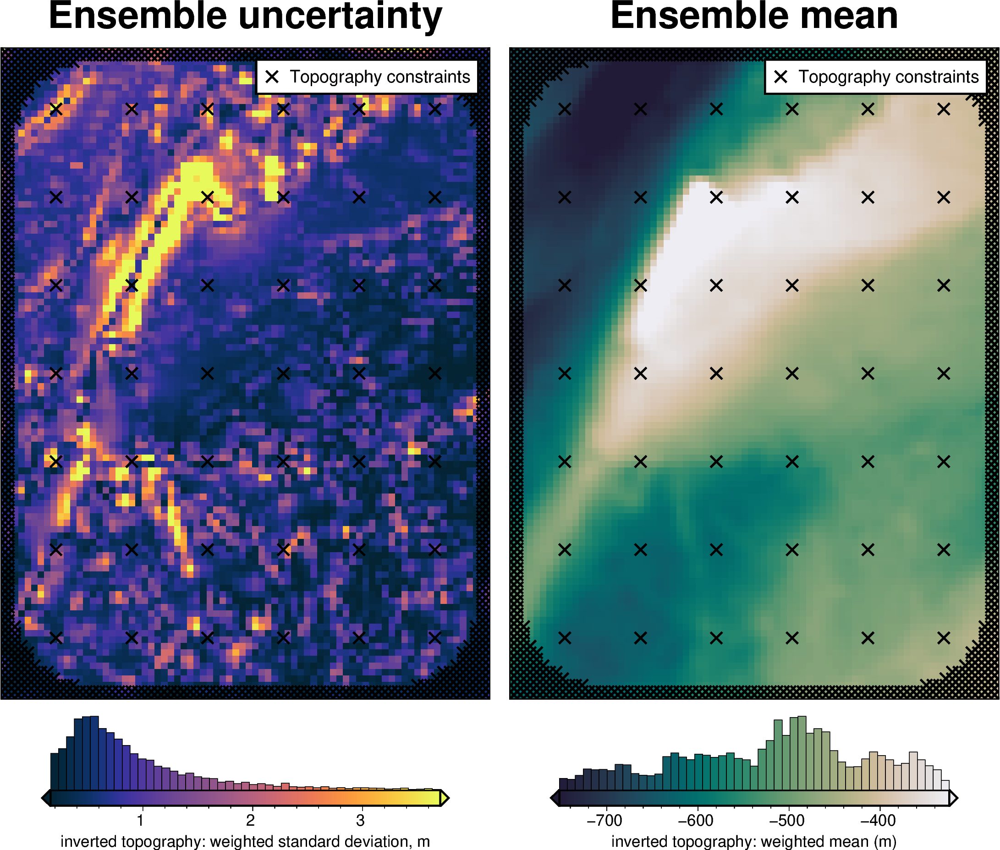

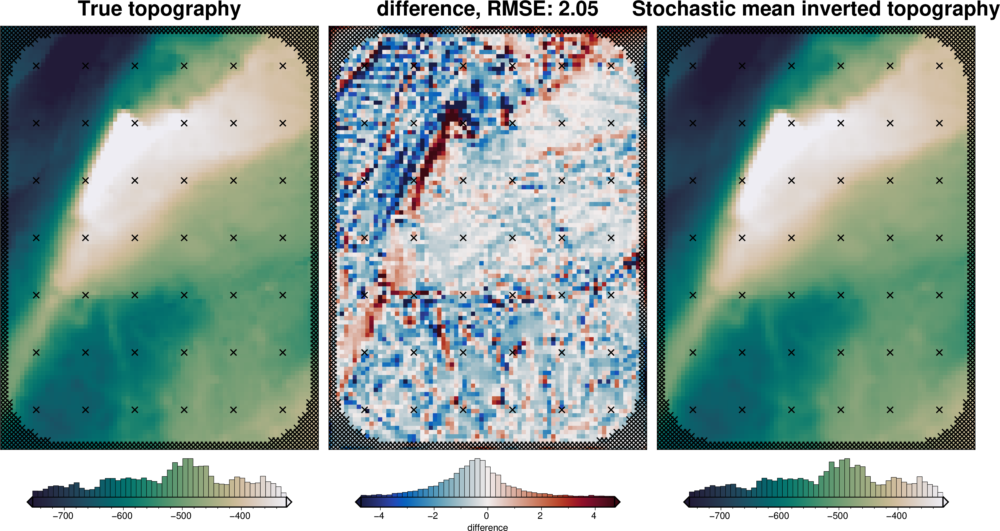

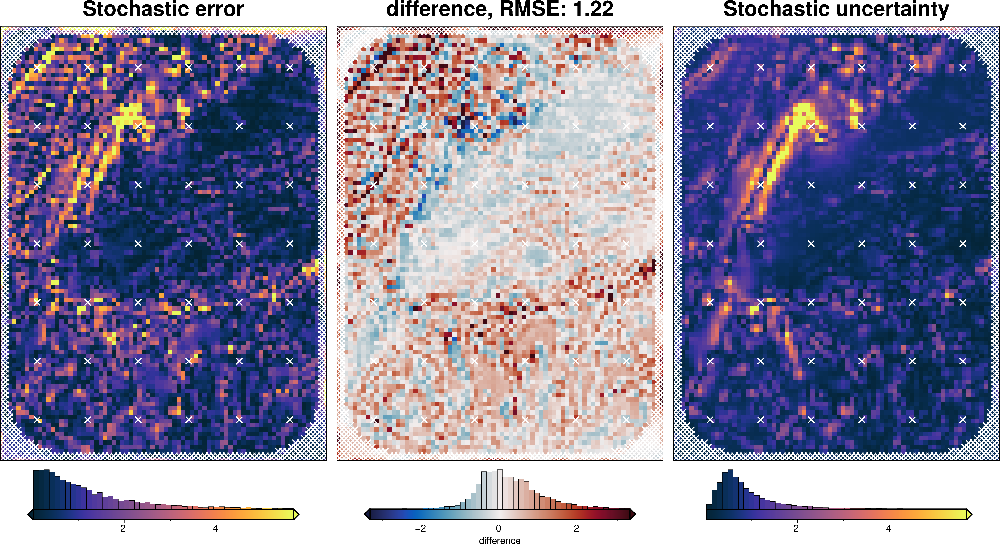

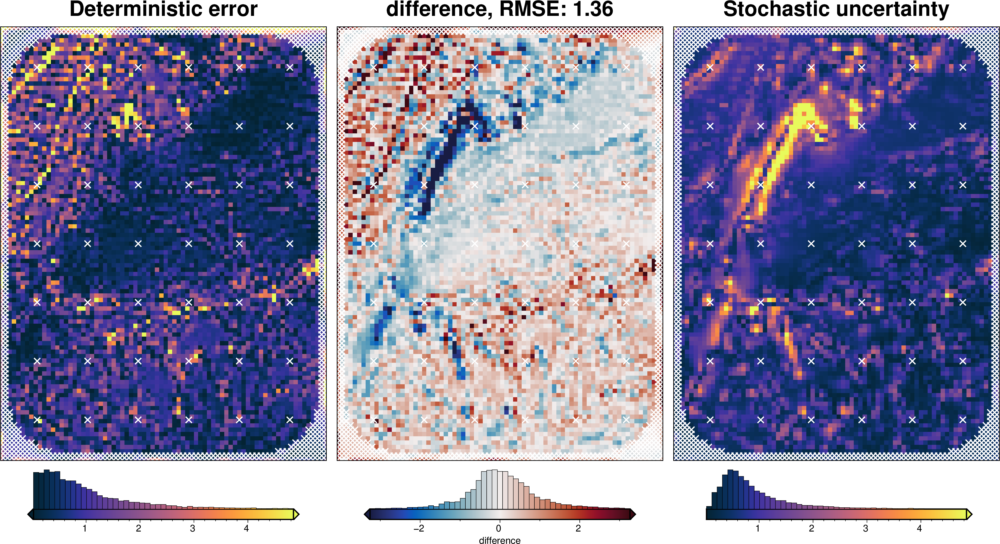

In [45]:
fname = f"{fpath}_uncertainty_full_test"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=20,
    parameter_dict=solver_dict | density_dict,
    **uncert_kwargs,
)

stats_ds = synth_plotting.uncert_plots(
    uncert_results,
    inversion_region,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points,
    weight_by="constraints",
)

### Comparing results

In [46]:
results = [
    uncert_results,
    uncert_density_results,
    uncert_damping_results,
]

# get cell-wise stats for each ensemble
stats = []
for r in results:
    ds = uncertainty.merged_stats(
        results=r,
        plot=False,
        constraints_df=constraint_points,
        weight_by="constraints",
        region=inversion_region,
    )
    stats.append(ds)

In [47]:
names = [
    "full",
    "density",
    "damping",
]

# get the standard deviation of the ensemble of ensembles
stdevs = []
for i, s in enumerate(stats):
    stdevs.append(s.weighted_stdev.rename(f"{names[i]}_stdev"))

merged = xr.merge(stdevs)
merged

<xarray.Dataset> Size: 186kB
Dimensions:        (northing: 101, easting: 76)
Coordinates:
  * northing       (northing) float64 808B -1.6e+06 -1.598e+06 ... -1.4e+06
  * easting        (easting) float64 608B -4e+04 -3.8e+04 ... 1.08e+05 1.1e+05
Data variables:
    full_stdev     (northing, easting) float64 61kB 0.6594 0.5762 ... 1.602
    density_stdev  (northing, easting) float64 61kB 0.3366 0.3439 ... 0.5004
    damping_stdev  (northing, easting) float64 61kB 0.676 0.4012 ... 1.703

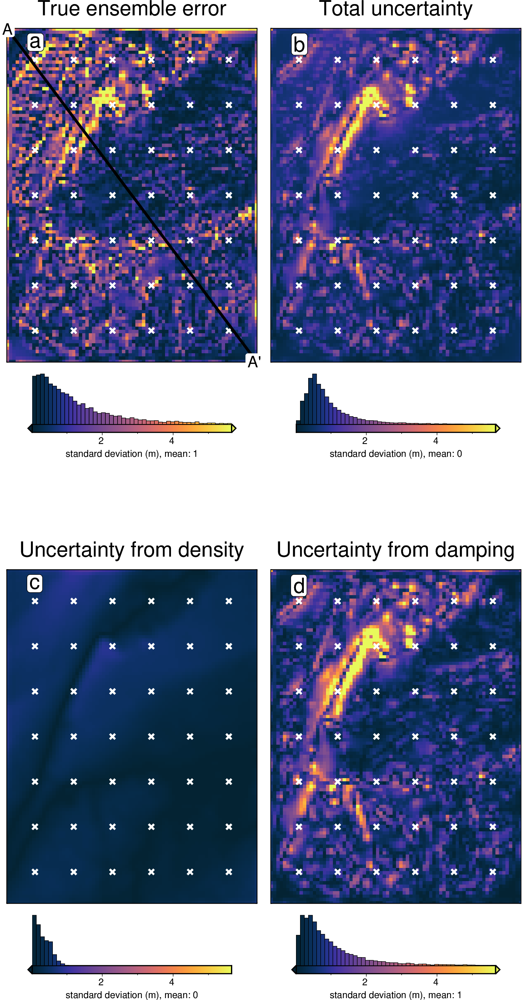

In [48]:
titles = [
    "True ensemble error",
    "Total uncertainty",
    "Uncertainty from density",
    "Uncertainty from damping",
]
grids = list(merged.data_vars.values())

grids.insert(0, np.abs(stats[0].weighted_mean - bathymetry))

cpt_lims = polar_utils.get_combined_min_max(grids, robust=True)

fig_height = 9
for i, g in enumerate(grids):
    xshift_amount = 1
    if i == 0:
        fig = None
        origin_shift = "initialize"
    elif i == 2:
        origin_shift = "both_shift"
        xshift_amount = -1
    else:
        origin_shift = "xshift"

    fig = maps.plot_grd(
        grid=g,
        fig_height=fig_height,
        title=titles[i],
        title_font="16p,Helvetica,black",
        cmap="thermal",
        cpt_lims=cpt_lims,
        robust=True,
        cbar_label=f"standard deviation (m), mean: {int(np.nanmean(g))}",
        hist=True,
        hist_bin_num=50,
        fig=fig,
        origin_shift=origin_shift,
        xshift_amount=xshift_amount,
        yshift_amount=-1.1,
    )
    fig.plot(
        x=constraint_points[constraint_points.inside].easting,
        y=constraint_points[constraint_points.inside].northing,
        style="x.2c",
        fill="white",
        pen="1.5p,white",
    )
    fig.text(
        position="TL",
        text=f"{string.ascii_lowercase[i]}",
        fill="white",
        pen=True,
        font="16p,Helvetica,black",
        offset="j.6/.2",
        clearance="+tO",
        no_clip=True,
    )
    if i == 0:
        # plot profiles location, and endpoints on map
        start = [inversion_region[0], inversion_region[3]]
        stop = [inversion_region[1], inversion_region[2]]
        fig.plot(
            vd.line_coordinates(start, stop, size=100),
            pen="2p,black",
        )
        fig.text(
            x=start[0],
            y=start[1],
            text="A",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
        fig.text(
            x=stop[0],
            y=stop[1],
            text="A' ",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
fig.show()

grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).


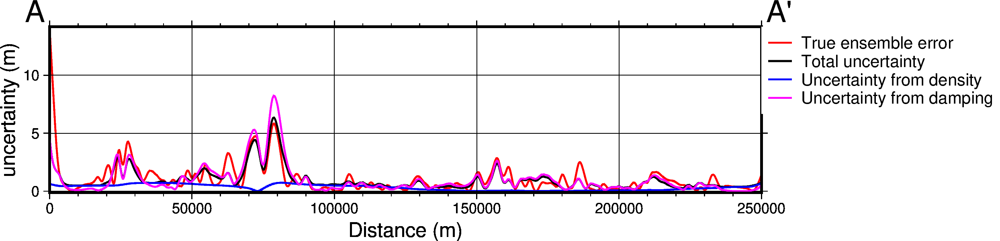

In [49]:
data_dict = profiles.make_data_dict(
    names=titles,
    grids=grids,
    colors=[
        "red",
        "black",
        "blue",
        "magenta",
        "cyan",
        "green",
        "purple",
    ],
)

fig, df_data = profiles.plot_data(
    "points",
    start=[inversion_region[0], inversion_region[3]],
    stop=[inversion_region[1], inversion_region[2]],
    num=10000,
    fig_height=4,
    fig_width=15,
    data_dict=data_dict,
    data_legend_loc="jTR+jTL",
    data_legend_box="+gwhite",
    data_buffer=0.01,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+luncertainty (m)"],
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)
fig.show()

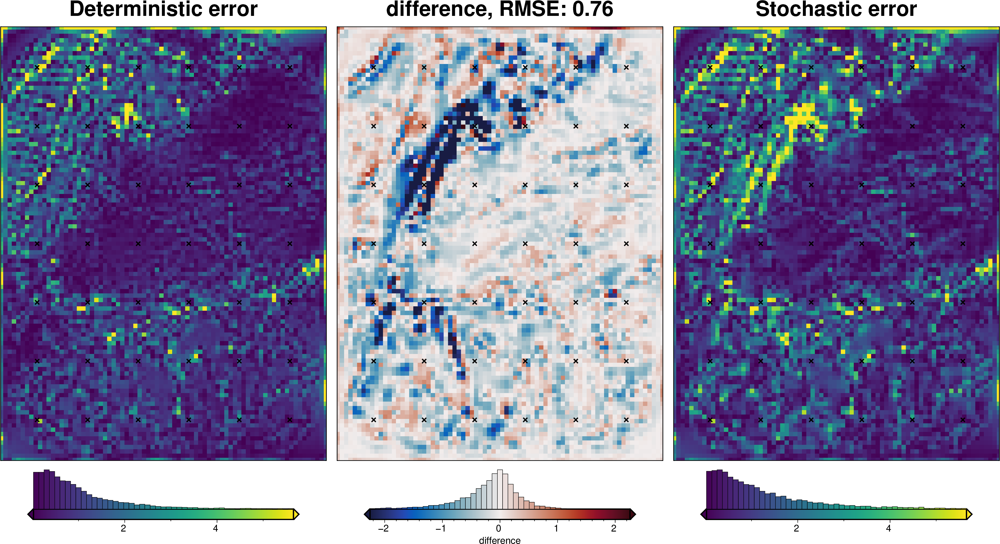

In [50]:
_ = polar_utils.grd_compare(
    inversion_error,
    np.abs(stats[0].weighted_mean - bathymetry),
    region=inversion_region,
    plot=True,
    grid1_name="Deterministic error",
    grid2_name="Stochastic error",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [51]:
# save results
merged.to_netcdf(f"{fpath}_sensitivity.nc")

In [52]:
stats_ds.to_netcdf(f"{fpath}_uncertainty.nc")